# XAI Final Project

Submitted in partial fulfillment of the requirements for the XAI course (2021-2022), University of Edinburgh

## Problem Statement

Text documents are one of the richest sources of data for businesses. For example, in this work, the BBC news dataset is considered that can provide valuable insights to a variety of businesses if the information extraction can be automated properly and machine learning (ML) models can do that job efficiently. Unlike other ML models, text classification models slightly differ in the way they extract information from the highly unstructured document data. Therefore, it becomes extremely important to explore how XAI techniques can be helpful in the information these text classification ML models provide. 

This project work focuses on using explainable machine (XAI) learning techniques on text classification models. The public dataset from the BBC is used in this project that comprises 1490 articles, each labelled under one of 5 categories: business, entertainment, politics, sport or tech. 

Two ML models namely Multinomial Baye's (MNB)classifier and XGBoost (XGB) classifier are designed to classify news articles.  Further, both the models are examined/investigated using three XAI techniques SHAP, LIME, and anchors. Results are discussed for both the models, for each XAI technique. Also, based on the interpretation of the results provided by the XAI techniques, final arguments are put forward to convince the stakeholder to proceed with either MNB or XGB model.



<a name="stakeholders"></a> 
## Potential stakeholders for the news classifier ML model.

*   Firstly, this use case is central to any news website.
*   Algorithic trading where automated trading systems need to identify/analyse news/stories to extract information for their trading strategies. For example, companies like [Virtu](https://www.virtu.com/).



## Details about the dataset

The [BBC news data](https://www.kaggle.com/shenurisumanasekara/bbc-news-classification/data), that was posted on the Kaggle website for the BBC News Classification/News Articles Categorization competition is used for this project. Originally the data folder of the competition consisted train dataset, test dataset and sample solution for the test dataset. In this project, the interest is not to validate the test dataset with the provided sample solution. To keep it simple, the test dataset and sample solutions for the test dataset are omitted from this project. Rather, only the train dataset is considered to build and validate the news classification model. The "BBC News Train.csv" is located in the main project folder and it is assumed that the "xai_final_project_B166593" project folder is placed exactly on **My Drive** of the google drive.

## Import libraries and dataset

In [ ]:
# Install required packages

!pip install shap
!pip install alibi
!pip install lime
from alibi.utils.download import spacy_model

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
import string
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
nltk.download('punkt')
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, plot_confusion_matrix, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
import shap
import transformers
from lime.lime_text import LimeTextExplainer
import spacy
from alibi.explainers import AnchorText
from tabulate import tabulate
from google.colab import drive

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
import warnings
warnings.filterwarnings('ignore')

The main project folder contains both the python notebook  and dataset. It is very essential to place the main project folder on "MY drive" as the data is loaded using the path shown in the below cell. Relative path of the dataset is `xai_final_project_B166593/BBC News Train.csv`.


In [ ]:
drive.mount('/content/drive')
bbc_news_data = pd.read_csv("/content/drive/My Drive/xai_final_project_B166593/BBC News Train.csv")
bbc_news_data.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,ArticleId,Text,Category
0,1833,worldcom ex-boss launches defence lawyers defe...,business
1,154,german business confidence slides german busin...,business
2,1101,bbc poll indicates economic gloom citizens in ...,business
3,1976,lifestyle governs mobile choice faster bett...,tech
4,917,enron bosses in $168m payout eighteen former e...,business


The given dataset consists of 3 columns. The `text` and `Category` columns are important for this project work.

In [ ]:
# Uncomment the below lines to manually load the data

#from google.colab import files
#uploaded = files.upload()
#bbc_news_data = pd.read_csv("/content/BBC News Train.csv", sep=';')
#bbc_news_data.head()

## Data processing

The below cell provides statistical measures for the data that is loaded and saved in `bbc_news_data` dataframe.` 



In [ ]:
bbc_news_data.describe(include=['O'])

,Text,Category
count,1490,1490
unique,1440,5
top,microsoft seeking spyware trojan microsoft is ...,sport
freq,2,346


In [ ]:
bbc_news_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1490 entries, 0 to 1489
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ArticleId  1490 non-null   int64 
 1   Text       1490 non-null   object
 2   Category   1490 non-null   object
dtypes: int64(1), object(2)
memory usage: 35.0+ KB


It can be observed that the `bbc_news_data` dataframe consists of 1490 rows and there are no missing values.

In [ ]:
bbc_news_data['Category'].value_counts()# provides the number of instances that are present in each category

sport            346
business         336
politics         274
entertainment    273
tech             261
Name: Category, dtype: int64

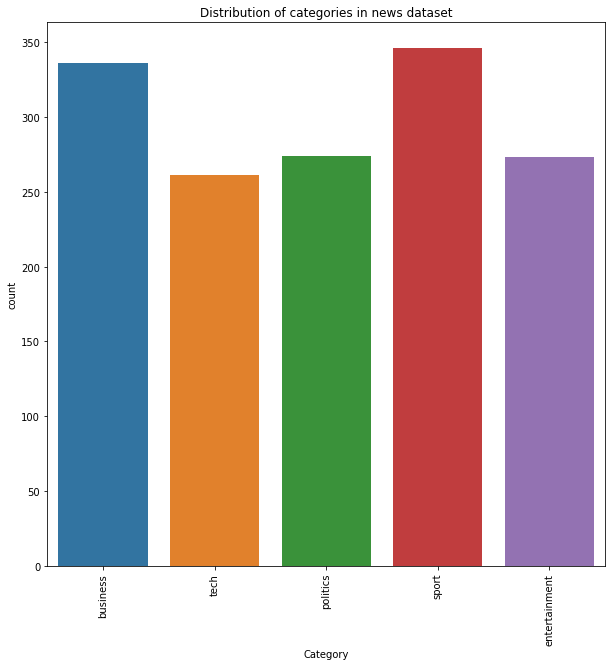

In [ ]:
plt.figure(figsize=(10, 10))
ax=sns.countplot(x='Category', data = bbc_news_data)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('Distribution of categories in news dataset')
plt.sca(ax)
plt.show()

The above plot shows the number of instances or news articles present in each category. It can be noticed that almost all the classes/categories consist of more or less the same number of instances. Hence, it can be concluded that the dataset is balanced.

In [ ]:
bbc_news_data.isnull().sum()

ArticleId    0
Text         0
Category     0
dtype: int64

There are no null values in the dataset.

The below cell encode categorical labels present in the column `Category` as numbers using `factorize()` function and a separate column called `labels` is created. 

In [ ]:
bbc_news_data['labels'] = bbc_news_data['Category'].factorize()[0]
bbc_news_data.head()

,ArticleId,Text,Category,labels
0,1833,worldcom ex-boss launches defence lawyers defe...,business,0
1,154,german business confidence slides german busin...,business,0
2,1101,bbc poll indicates economic gloom citizens in ...,business,0
3,1976,lifestyle governs mobile choice faster bett...,tech,1
4,917,enron bosses in $168m payout eighteen former e...,business,0


The following function`clean_text` cleans the raw text present in the `Text` column. This function removes special characters, numbers, urls, etc. and also converts all the text into lower case.

In [ ]:
def clean_text(text):
    text = text.lower()                                  # lower-case all characters
    text =  re.sub(r'@\S+', '',text)                     # remove twitter handles
    text =  re.sub(r'http\S+', '',text)                  # remove urls
    text =  re.sub(r'pic.\S+', '',text) 
    text =  re.sub(r"[^a-zA-Z+']", ' ',text)             # only keeps characters
    text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text+' ')      # keep words with length>1 only
    text = "".join([i for i in text if i not in string.punctuation])
    words = nltk.tokenize.word_tokenize(text)
    stopwords = nltk.corpus.stopwords.words('english')   # remove stopwords
    text = " ".join([i for i in words if i not in stopwords and len(i)>2])
    text= re.sub("\s[\s]+", " ",text).strip()            # remove repeated/leading/trailing spaces
    return text

A new column `cleaned_text` is created to store cleaned data present in the `Text` column.

In [ ]:
bbc_news_data['cleaned_text'] = bbc_news_data['Text'].apply(clean_text)
bbc_news_data.head()

,ArticleId,Text,Category,labels,cleaned_text
0,1833,worldcom ex-boss launches defence lawyers defe...,business,0,worldcom boss launches defence lawyers defendi...
1,154,german business confidence slides german busin...,business,0,german business confidence slides german busin...
2,1101,bbc poll indicates economic gloom citizens in ...,business,0,bbc poll indicates economic gloom citizens maj...
3,1976,lifestyle governs mobile choice faster bett...,tech,1,lifestyle governs mobile choice faster better ...
4,917,enron bosses in $168m payout eighteen former e...,business,0,enron bosses payout eighteen former enron dire...


<a name="eda"></a> 
### Exploratory data analysis

A word cloud is an image containing words displayed in different sizes. The size of the words determines the importance of the words — the bigger and bolder the word, the more frequently the word appears in a given block of text. 

The below cell generates 5 different groups of `cleaned_text` based on the categories present in the dataset.

In [ ]:
news_groups = bbc_news_data.groupby("Category") # create a new dataframe that is grouped based on the category

business_news = news_groups.get_group("business")["cleaned_text"] # consists of cleaned_text that belongs to business class
tech_news = news_groups.get_group("tech")["cleaned_text"]# tech class cleaned_text
politics_news = news_groups.get_group("politics")["cleaned_text"]# politics class cleaned_text
sport_news = news_groups.get_group("sport")["cleaned_text"]# sport class cleaned_text
entertainment_news = news_groups.get_group("entertainment")["cleaned_text"]# entertainment class cleaned text

In [ ]:
'''
This function takes an argument that is a pandas series 
consisting of text data and plots the worldcloud plot.
'''
def generate_worldcloud(news_group):
  text = " ".join(i for i in news_group)
  wordcloud = WordCloud(background_color="black")
  wordcloud.generate(text)
  plt.figure(figsize=(15,10))
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show()

World cloud plot for business class


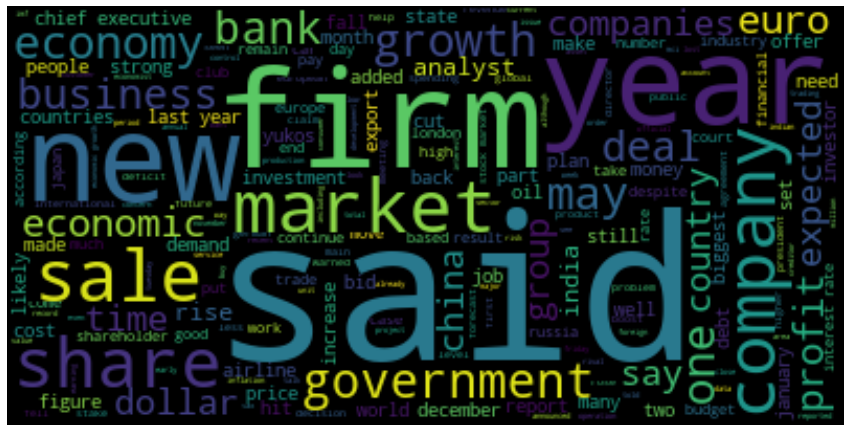

In [ ]:
print("\033[1m"+"World cloud plot for business class"+"\033[1m") # "\033[1m" ascii code is used to make the print statement bold
generate_worldcloud(business_news)

As depicted in the above plot it can be noticed that new, sale, said, firm, company, market, government are a few words that appear more in that class. A similar observation can be made for other worldcloud plots.

World cloud plot for tech class


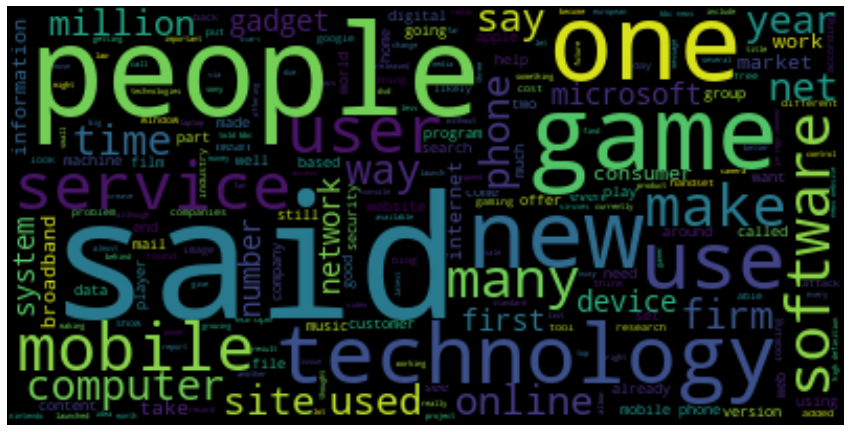

In [ ]:
print("\033[1m"+"World cloud plot for tech class"+"\033[1m")
generate_worldcloud(tech_news)

World cloud plot for politics class


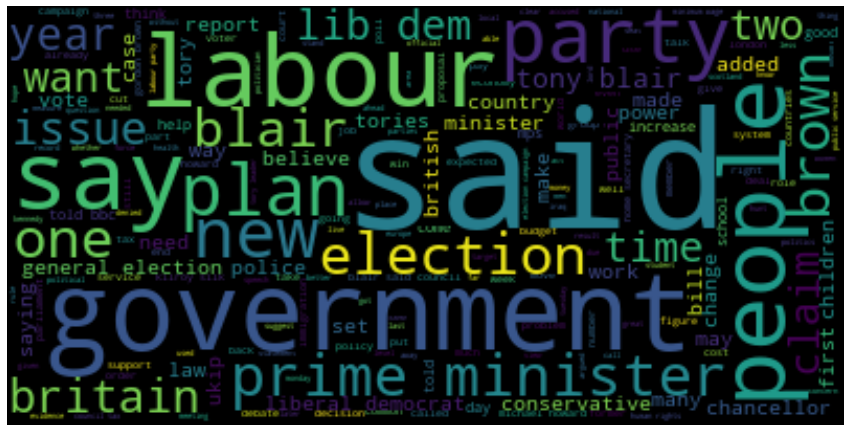

In [ ]:
print("\033[1m"+"World cloud plot for politics class"+"\033[1m")
generate_worldcloud(politics_news)

World cloud plot for sport class


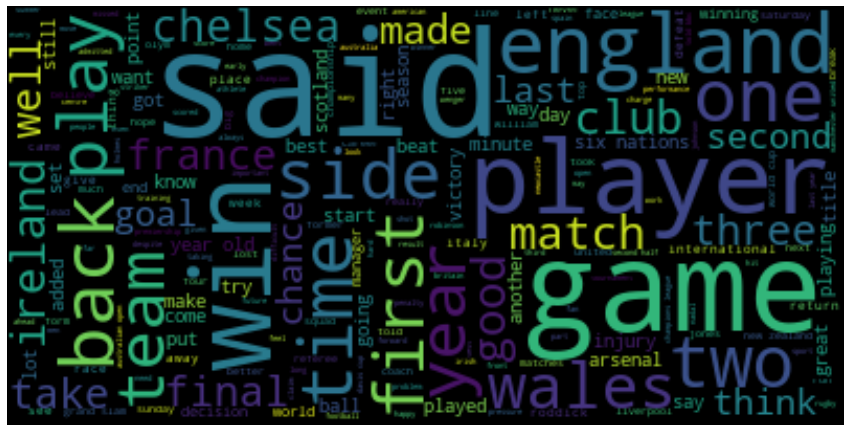

In [ ]:
print("\033[1m"+"World cloud plot for sport class"+"\033[1m")
generate_worldcloud(sport_news)

World cloud plot for entertainment class


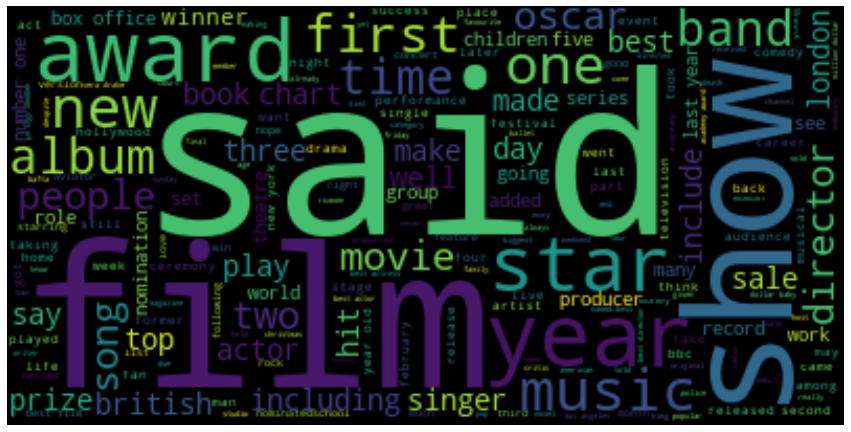

In [ ]:
print("\033[1m"+"World cloud plot for entertainment class"+"\033[1m")
generate_worldcloud(entertainment_news)

A dictionary called `labels_cat_id` is created to store the categorical variables and their corresponding numerical presentation for future use.

In [ ]:
labels_cat_id = bbc_news_data[['Category', 'labels']].drop_duplicates().sort_values('labels')
labels_cat_id = dict(labels_cat_id.values)
labels_cat_id.keys()

dict_keys(['business', 'tech', 'politics', 'sport', 'entertainment'])

The below cell splits the data into train(80%) and test(20%) dataset.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(bbc_news_data['cleaned_text'],bbc_news_data['Category'], test_size = 0.2, random_state = 42)#,shuffle=True, stratify=bbc_news_data['Category'])

print(len(X_train))
print(len(X_test))

1192
298


## Modelling

* As mentioned earlier, two ML models are considered in this work, Multinomial Naive Baye's (MNB) and XGBoost (XGB) classifiers. [Sklearn's pipeline models](https://scikit-learn.org/stable/tutorial/text_analytics/working_with_text_data.html) are very handy for text classification problems as they unify extracting `term frequencies (tf)` and the classifier model. Both the models are designed with the default parameters.

* The `TF-IDF vectorizer` is used in both the classifier modelling, the term tf–idf stands for term frequency-inverse document frequency. Essentially, it provides the number of times a word appears in a document divided by the total number of words in the document. Every document has its term frequency.

* The Multinomial Naive Baye's  classifier has been proved a very effective method to classify text data. It is very simple to implement and also works well for muti-class classification. Further, it works well for small dataset and is an interpretable model.

* Of late, the XGBoost  classifier has been proved an effective classifier for various types of data. The XGB classifier works very well with the huge dataset and for multi-class classification. This comes under the category of opaque models.

* Basic models are considered in this project work (hyperparameters tuning is not considered to improve the performance of both the models). 

The below cell consists of a function `model_assessment` that presents the evaluation of the model in the form of normalised confusion matrix and the classification report. 

In [ ]:
'''
This function is originally from XAI course codebooks.
The function is altered to display categorical variables.
'''
def model_assessment(model, X, y):

    # Get the confusion matrix.
    print("Confusion matrix:")
    disp = plot_confusion_matrix(model, X, y,
                                 cmap=plt.cm.Blues,
                                 normalize='true')
    
    disp.ax_.set_title("Normalized confusion matrix")
    disp.ax_.set_xticklabels(y, rotation=90)
    disp.ax_.xaxis.set_ticklabels(labels_cat_id.keys())
    disp.ax_.yaxis.set_ticklabels(labels_cat_id.keys());
   
    # Produce a classification report.
    print("Classification Report:")
    pred = model.predict(X)
    print(classification_report(y, pred))
    print('\n')  
    print("Done!")

<a name="mnb"></a> 
### MNB model

The following cell configures `MNB` classifier with `TfidfVectorizer()` using sklearn's pipeline.

In [ ]:
nb_model = Pipeline([('tfidf', TfidfVectorizer()),
               ('clf', MultinomialNB()),
              ])
nb_model.fit(X_train,y_train)
y_pred_nb = nb_model.predict(X_test)
print(accuracy_score(y_pred_nb, y_test)) # prints the classsifier's accuracy on test data


0.9630872483221476


Confusion matrix:
Classification Report:
               precision    recall  f1-score   support

     business       0.95      0.97      0.96        75
entertainment       1.00      0.98      0.99        46
     politics       0.93      0.95      0.94        56
        sport       0.97      1.00      0.98        63
         tech       0.98      0.91      0.95        58

     accuracy                           0.96       298
    macro avg       0.97      0.96      0.96       298
 weighted avg       0.96      0.96      0.96       298



Done!


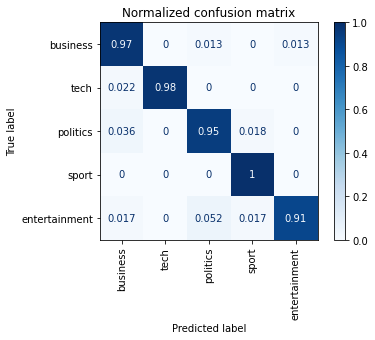

In [ ]:
model_assessment(nb_model, X_test, y_test) # model assessment of MNB model

* It can be observed that the MNB model provides an overall accuracy of 96%.
* Overall, the classifier performs well for all the classes.



The below code computes the number of misclassified instances from the MNB classifier and stores in a dataframe (display purpose).

In [ ]:
misclassified_nb = y_pred_nb != y_test # A boolean list of misclassified instances
misclassified_index_nb = [i for i, x in enumerate(misclassified_nb) if x] # indices of misclassified instances
misclassified_nb_dict = {"misclassified_index_nb": misclassified_index_nb,
                          "true_label": y_test.iloc[misclassified_index_nb],
                          "predicted_label": y_pred_nb[misclassified_index_nb]
                          }
misclassified_nb_instances = pd.DataFrame(misclassified_nb_dict).reset_index(drop=True)
misclassified_nb_instances

,misclassified_index_nb,true_label,predicted_label
0,0,entertainment,business
1,3,tech,politics
2,4,tech,sport
3,15,tech,politics
4,39,business,tech
5,91,politics,business
6,149,politics,business
7,163,tech,business
8,187,tech,politics
9,250,politics,sport


<a name="mnb_miscla"></a> 
The below code extracts instances that belong to the `business` class but are classified as others (type 1) and vice-versa (type 2). Used in future steps.

In [ ]:
nb_to_plot_type1 = list(misclassified_nb_instances.groupby("true_label").get_group("business")["misclassified_index_nb"])
nb_to_plot_type2 = list(misclassified_nb_instances.groupby("predicted_label").get_group("business")["misclassified_index_nb"])
print(f"Misclassified instances that are of business class:  {nb_to_plot_type1}")
print(f"Misclassified instances that belong to other classes but are classified as business class: {nb_to_plot_type2}")

Misclassified instances that are of business class:  [39, 294]
Misclassified instances that belong to other classes but are classified as business class: [0, 91, 149, 163]


**Observations**

* If the aim is to design a news classifier for any news website then this model may work very well according to the classification statistics it is providing.

* It can be noticed that the test instances 39 and 294 belong to the `business` class and are misclassified (type 1). It would be of our interest to examine these two instances in detail as [automated algorithmic trading](#stakeholders) company would be highly interested to know as it is very much interested in stories/news that belongs to the `business` category. Also, the company would be evenly interested in investigating the instances that are from other categories and are misclassified as `business` class that are instances 0, 91,149 and 163 (type 2).


<a name="xgb"></a> 
### XGB model

The below cell configures `XGB` classifier with `TfidfVectorizer()` using sklearn's pipeline.

In [ ]:
xgb_model = Pipeline([('tfidf', TfidfVectorizer()),
               ('clf', XGBClassifier()),
              ])
xgb_model.fit(X_train,y_train)
y_pred_xgb = xgb_model.predict(X_test)
print(accuracy_score(y_pred_xgb, y_test)) # prints the accuracy of the model on test data

0.9496644295302014


Confusion matrix:
Classification Report:
               precision    recall  f1-score   support

     business       0.93      0.95      0.94        75
entertainment       0.91      0.91      0.91        46
     politics       0.95      0.96      0.96        56
        sport       0.97      1.00      0.98        63
         tech       0.98      0.91      0.95        58

     accuracy                           0.95       298
    macro avg       0.95      0.95      0.95       298
 weighted avg       0.95      0.95      0.95       298



Done!


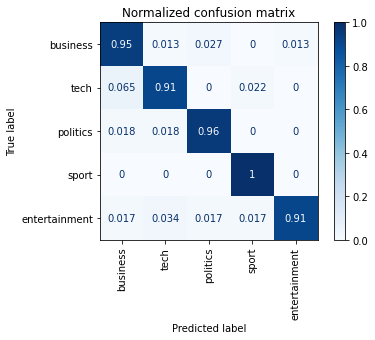

In [ ]:
model_assessment(xgb_model, X_test, y_test)

**Observations**

* Overall accuracy of `XGB` model is 95%, which is very close to `MNB` model.
* Performance of the model for all the classes is similar to that has been obtained for `MNB` model.
* More or less both the models provide similar and good performance on the test data.

<a name="xgb_miscla"></a> 
The below code computes the misclassified indices of XGB model and stores in a datframe (display purpose).

In [ ]:
misclassified_xgb = y_pred_xgb != y_test # a boolean list of misclassified instances
misclassified_index_xgb = [i for i, x in enumerate(misclassified_xgb) if x] # indices of misclassified instances
misclassified_xgb_dict = {"misclassified_index_xgb": misclassified_index_xgb,
                          "true_label": y_test.iloc[misclassified_index_xgb],
                          "predicted_label": y_pred_xgb[misclassified_index_xgb]
                          }
misclassified_xgb_instances = pd.DataFrame(misclassified_xgb_dict).reset_index(drop=True)
misclassified_xgb_instances

,misclassified_index_xgb,true_label,predicted_label
0,4,tech,sport
1,12,business,politics
2,39,business,tech
3,57,politics,entertainment
4,102,entertainment,sport
5,112,tech,business
6,139,entertainment,business
7,169,tech,entertainment
8,187,tech,politics
9,242,entertainment,business


**Observations**

* The misclassified instances (type 1 ) of the MNB model are also common to the XGB model. However, XGB model has aditional type 1  misclassified instances compared to the MNB model.

The below code extracts instances that belong to the business class but are classified as others (type 1) and vice-versa (type 2). 

In [ ]:
xgb_to_plot_type1 = list(misclassified_xgb_instances.groupby("true_label").get_group("business")["misclassified_index_xgb"])
xgb_to_plot_type2 = list(misclassified_xgb_instances.groupby("predicted_label").get_group("business")["misclassified_index_xgb"])
print(f"Misclassified instances that are of business class:  {xgb_to_plot_type1}")
print(f"Misclassified instances that belong to other classes but are classified as business class: {xgb_to_plot_type2}")

Misclassified instances that are of business class:  [12, 39, 282, 294]
Misclassified instances that belong to other classes but are classified as business class: [112, 139, 242, 249, 250]


 Similar to the `MNB` model, misclassified instances that belong to the `business` class and instances from other classes that are wrongly classified as the `business` class are of main interest for this study.

In the below cell vectorized train and test data is prepared for later use.

In [ ]:
tf=TfidfVectorizer()
X_train_tf = tf.fit_transform(list(X_train))
X_test_tf = tf.transform(list(X_test))

## XAI analysis

### SHAP XAI

* SHAP can be used to obtain both global and local explanations.
* SHAP has both `model-agnostic` and `model-specific` explainers.


#### SHAP for MNB model



* KernelExplainer is a model-agnostic explainer/API and it is used to analyse `MNB` model that is designed [above](#mnb).
* Kernelexplainer is very slow and computationally very expensive. For a larger test size the code crashes.
* Therefore, only first 10 test instances are used to get a glimpse of global explanation.


  0%|          | 0/10 [00:00<?, ?it/s]

SHAP summary plot for MNB model (for first 10 instances of test data)


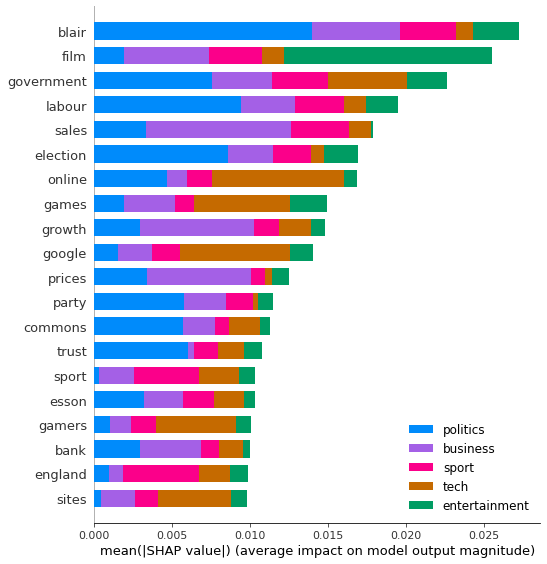

In [ ]:
shap_explainer_nb = shap.KernelExplainer(nb_model.named_steps["clf"].predict_proba, X_train_tf[:10]) # define explainer
shap_values_nb = shap_explainer_nb.shap_values(X_test_tf[:10]) # compute shap values for first 10 instances
print("\033[1m"+"SHAP summary plot for MNB model (for first 10 instances of test data)"+"\033[1m")
shap.summary_plot(shap_values_nb, 
                  X_test_tf[:10],
                  feature_names=nb_model[:-1].get_feature_names_out(), 
                  class_names=nb_model.classes_)

**Observations**

* The summary plot combines feature importance with feature effects. The above SHAP summary plot provides a global information of the model (although it is limited to a small sample test dataset here). 
* It can be seen that top features or words are `blair`, `film`, `government`, `sales` and `online`.
* The plot shows how the features/words are contributing to shapley values of each class.
* The top important features are contributing to the `business` class prediction of the model.

In [ ]:
nb_model.classes_ # to ensure the MNB model's classes and their order

array(['business', 'entertainment', 'politics', 'sport', 'tech'],
      dtype='<U13')

The below SHAP summary plot is generated for the class `business`.

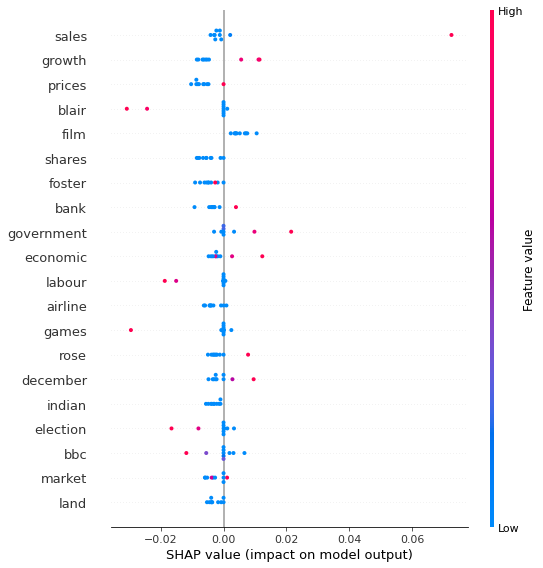

In [ ]:
shap.summary_plot(shap_values_nb[0], 
                  X_test_tf[:10].toarray(),
                  feature_names=nb_model[:-1].get_feature_names_out(), 
                  class_names='business' )

**Observations**

* The above SHAP summary plot depicts a global explanation for the `business` class. 
* For the`business` class the top important five features are `sales`, `prices`, `growth`, `blair` and `film`.
* Since the considered test sample is small (10 instances), we can see only a few instances on the plot. 
* It can be noticed that the `sales` feature contributes more to the shapley values for one particular instance.

Generate `shap_values` for a single instance, a [misclassified](#mnb_miscla) instance (type 1) computed above for `MNB` model.

In [ ]:
print (f"Computing shap values for misclassified instance (type 1): {nb_to_plot_type1[0]}" )
shap_values_nb_ex1 = shap_explainer_nb.shap_values(X_test_tf[nb_to_plot_type1[0]])

Computing shap values for misclassified instance (type 1): 39


  0%|          | 0/1 [00:00<?, ?it/s]

The below code is used to get the colour distribution on the SHAP plots in the later steps. A few plots take it as an argument to produce the coulored plot.

In [ ]:
colour_test = pd.DataFrame(X_test_tf.todense())
colour_test.shape

(298, 21173)

The below code generates SHAP force plot for a misclassified instance (type 1) of the MNB model. Force plots provide a local explanation and in this case, that single instance is investigated from the perspective of all the classes.

In [ ]:
shap.initjs()
print("\033[1m"+"The following shap force plots are for a misclassified instance(type 1) of MNB model"+"\033[1m")
for i in range (len(nb_model.classes_)):
  print("\033[1m"+ "The force plot for class \t" + nb_model.classes_[i] + "\033[1m\n")
  display(shap.force_plot(shap_explainer_nb.expected_value[i], 
                          shap_values_nb_ex1[i], 
                          colour_test.iloc[nb_to_plot_type1[0], :],
                          feature_names=tf.get_feature_names()))

The following shap force plots are for a misclassified instance(type 1) of MNB model
The force plot for class 	business



The force plot for class 	entertainment



The force plot for class 	politics



The force plot for class 	sport



The force plot for class 	tech



**Observations**
* SHAP force plot provides a local explantion.
* From the above SHAP force plots, it is very clear that for this particular misclassified instance (instance 39), the feature/word `commission` is trying to push the instance towards the `business` class. But, the feature `mobile` is strongly pushing the instance away from the base value of the `business` class. 

* It is evident from the SHAP force plot for the `tech` class that there are multiple features in the document/instance that are related to technology like `phones`, `mobile`, etc. Certainly, it could be an article that is related to business in technology. The only feature/word `commission` is pushing the instance towards the base value but, clearly not enough to change its classification to the `business` class.

* It can be noted that this instance does not contain the important features that are plotted above in the SHAP summary plot for the `business` class.


The below code generates shap values for a [misclassified instance](#mnb_miscla) (type 2) of `MNB` model.

In [ ]:
print (f"Computing shap values for misclassified instance (type 2): {nb_to_plot_type2[0]}" )
shap_values_nb_ex2 = shap_explainer_nb.shap_values(X_test_tf[nb_to_plot_type2[0]])

Computing shap values for misclassified instance (type 2): 0


  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
shap.initjs()
print("\033[1m"+"The following shap force plots are for a misclassified instance of MNB model (type 2)"+"\033[1m")
for i in range (len(nb_model.classes_)):
  print("\033[1m"+ "The force plot for class \t" + nb_model.classes_[i] + "\033[1m\n")
  display(shap.force_plot(shap_explainer_nb.expected_value[i], 
                          shap_values_nb_ex2[i], 
                          colour_test.iloc[nb_to_plot_type2[0], :],
                          feature_names=tf.get_feature_names()))

The following shap force plots are for a misclassified instance of MNB model (type 2)
The force plot for class 	business



The force plot for class 	entertainment



The force plot for class 	politics



The force plot for class 	sport



The force plot for class 	tech



* The above SHAP force plots for misclassified instance (instance 0) is misclassified as the `business` class. 
* The features  `wal` and `mart` are strongly pushing the base value towards the `business` class.
* However, the feature `music` is equally trying to push the instance towards the `entertainment` class and that is not sufficient to get the instance classified as the `entertainment` class.


#### SHAP for XGB model


* TreeExplainer is a model-specific explainer/API and it is used to analyse XGB model that is designed [above](#xgb).

* Compared to Kernelexplainer, TreeExplainer is very fast and works efficiently for a larger test dataset.

* Therefore, entire test dataset is used to obtain global explanations.



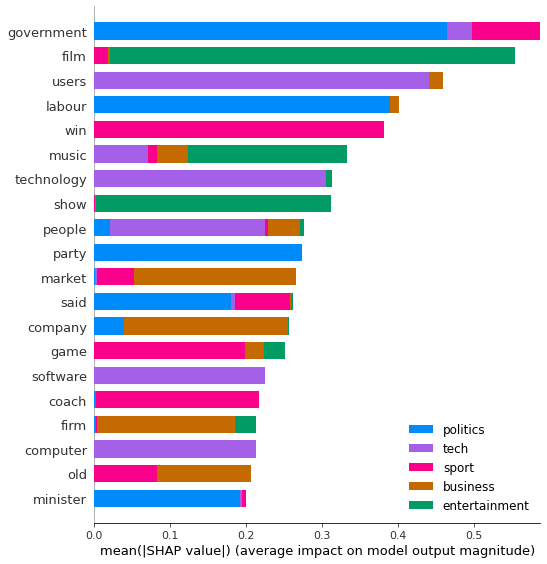

In [ ]:
shap_values_xgb = shap.TreeExplainer(xgb_model.named_steps["clf"]).shap_values(X_test_tf)
shap.summary_plot(shap_values_xgb,
                  X_test_tf, 
                  feature_names=xgb_model[:-1].get_feature_names_out(), 
                  class_names=xgb_model.classes_)

**Observations**

* According to the above SHAP summary plot, `government`, `film`, `users`, `labour` and `win` are the top 5 important features.
* The plot also depicts the contribution of features/words to each class.
* It can be noticed that there is a very minimal contribution of top 5 important features to the `business` class. A few features listed later like `market`, `firm` and `company` contribute more to the `business` class.


In [ ]:
xgb_model.classes_ # this is to ensure the order of the classes

array(['business', 'entertainment', 'politics', 'sport', 'tech'],
      dtype=object)

The below code generates SHAP summary plot for the `business` class.

Shap summary plot for class 	business


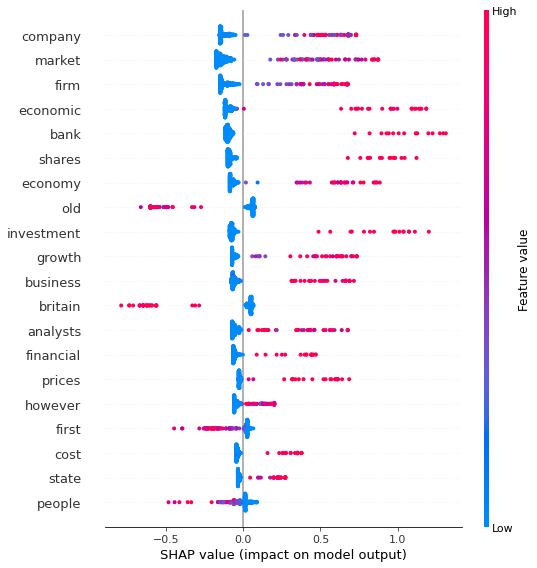

In [ ]:
print("\033[1m"+"Shap summary plot for class \t" + xgb_model.classes_[0] +"\033[1m" )
shap.summary_plot(shap_values_xgb[0], 
                  X_test_tf.toarray(),
                  feature_names=xgb_model[:-1].get_feature_names_out(), 
                  class_names='business')

**Observations**

* The above SHAP summary plot depicts the contribution of features/words to the `business` class. 

* This plot is more convincing compared to the SHAP summary plot(`business`) for the MNB model plotted above, as all the test dataset is considered to compute the shap values.

* Top 5 important features are `company`, `market`, `firm`, `economic`   and     `bank`. It can be recalled that these words were prominent in the [world cloud](#eda) plot for the `business` class above. 

The below code generates shap values for the [misclassified instance](#xgb_miscla) (type 1) of XGB model

In [ ]:
print (f"Computing shap values for misclassified instance (type 1): {xgb_to_plot_type1[0]}" )
shap_values_xgb_ex1 = shap.TreeExplainer(xgb_model.named_steps["clf"]).shap_values(X_test_tf[xgb_to_plot_type1[0]])

Computing shap values for misclassified instance (type 1): 12


In [ ]:
shap.initjs()
print("\033[1m"+ "The following shap force plots are for misclassified instance of XGB model (type 1)"+"\033[1m")
for i in range (len(xgb_model.classes_)):
  print(f"The force plot for class {xgb_model.classes_[i]}")
  display(shap.force_plot(shap.TreeExplainer(xgb_model.named_steps["clf"]).expected_value[i], 
                          shap_values_xgb_ex1[i], 
                          colour_test.iloc[xgb_to_plot_type1[0], :], 
                          feature_names=tf.get_feature_names()))

The following shap force plots are for misclassified instance of XGB model (type 1)
The force plot for class business


The force plot for class entertainment


The force plot for class politics


The force plot for class sport


The force plot for class tech


**Observations**

•	The above SHAP force plots indicate that the presence of important global features like `government`, `law` and `said` has pushed the instance towards the politics class.

•	There are features like `market`, `trade` and `foreign` that contribute more to the shapley values of the business class but are not sufficient to classify the instance as business class.


The below cell generates shap values for a [misclassified instance](#xgb_miscla) (type 2) of XGB model.

In [ ]:
print (f"Computing shap values for misclassified instance (type 2): {xgb_to_plot_type2[0]}" )
shap_values_xgb_ex2 = shap.TreeExplainer(xgb_model.named_steps["clf"]).shap_values(X_test_tf[xgb_to_plot_type2[0]])

Computing shap values for misclassified instance (type 2): 112


In [ ]:
shap.initjs()
print("\033[1m"+"The following shap force plots are for misclassified instance of XGB model (type 2)"+"\033[1m")
for i in range (len(xgb_model.classes_)):
  print(f"The force plot for class {xgb_model.classes_[i]}")
  display(shap.force_plot(shap.TreeExplainer(xgb_model.named_steps["clf"]).expected_value[i], 
                          shap_values_xgb_ex2[i], 
                          colour_test.iloc[xgb_to_plot_type2[0], :], 
                          feature_names=tf.get_feature_names()))

The following shap force plots are for misclassified instance of XGB model (type 2)
The force plot for class business


The force plot for class entertainment


The force plot for class politics


The force plot for class sport


The force plot for class tech


**Observations**

*  This instance consists of important features that are particularly important to the `business` class like `companies` ,`business` and `firm`. Therefore, resulting in a misclassification of this instance as the `business` class.

* There are some features that are prominent to the `tech` class in this instance but their contribution was not sufficient to push the instance towards the tech class.

The below code generates the SHAP dependence plot of feature `prices` for the `business` class by setting an `interaction index` to `sales`.

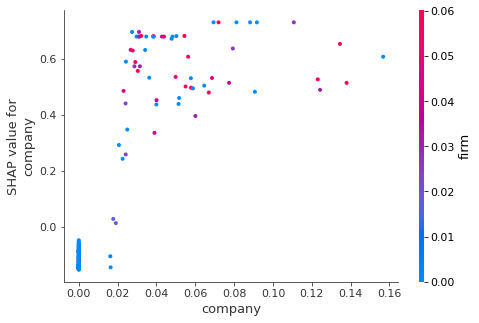

In [ ]:
shap.dependence_plot("company", 
                     shap_values_xgb[0], 
                     X_test_tf.toarray(), 
                     feature_names=xgb_model[:-1].get_feature_names_out(), 
                     interaction_index="firm")

**Observations**

* The above dependence plot shows the effect of the feature `company`  on the predictions made by the model by setting the interaction index to feature `firm`.

* It can be observed that most of the instances do get affected by the feature `company` and contribute more for the model prediction. It can also be noted that there is a high interaction with the feature `firm`.

----------------------------------------------

### LIME XAI

* LIME is a model-agnostic XAI technique.

* The technique attempts to understand the model by perturbing the input of data samples and understanding how the predictions change.

* The output of LIME is a list of explanations, reflecting the contribution of each feature to the prediction of a data sample. This provides local explanation, and it also allows to determine which feature changes will have most impact on the prediction.

* LIME works faster.

#### LIME XAI for MNB model

The below cell stores the classes to a list that can be used in the further steps.

In [ ]:
classes = list(labels_cat_id.keys())
classes

['business', 'tech', 'politics', 'sport', 'entertainment']

Configure the LIME text explainer. Obtain the explanations for the first 2 misclassified instances of MNB model (type 1)



In [ ]:
X_test_list = list(X_test)
LIME_explainer = LimeTextExplainer(class_names=classes)
for i in range (2):
  print("\033[1m" +"LIME text explanation for misclassified instance", nb_to_plot_type1[i], \
        "of MNB model (type 1)"+"\033[1m")
  LIME_explainer_nb = LIME_explainer.explain_instance(X_test_list[nb_to_plot_type1[i]], 
                                                      nb_model.predict_proba, top_labels=5)
  LIME_explainer_nb.show_in_notebook(text=True)

Output hidden; open in https://colab.research.google.com to view.

**Observations**

•	LIME explanations are easy to understand. On the left side, the probabilities of each class are specified. On the right side, there are visual explanations for each of the classes with the features listed along with the class.

•	It has to be noted that for each class, the words on the right side of the line are positive, and the words on the left side are negative. 

•	It is very clear for the first instance (instance 39) that the features `mobile`, `phone` and `operators` are negatively impacting. Though, the instance has features that are related to the business class such as `market`, `company`, etc. Their contribution is not enough to classify the instance as the business class. (It can be recalled that the SHAP force plot conclusion was also similar for this instance).

•	A similar explanation can be extended to the second instance (instance 294). It has features that are strong contributors to the politics class. 


The below code generates LIME explanations for the misclassified instances of the MNB model (type 2).

In [ ]:
for i in range (2):
  print("\033[1m" +"LIME text explanation for misclassified instances ", nb_to_plot_type2[i], \
        "of MNB model (type 2)"+"\033[1m")
  LIME_explainer_nb = LIME_explainer.explain_instance(X_test_list[nb_to_plot_type2[i]],
                                                      nb_model.predict_proba, top_labels=5)
  LIME_explainer_nb.show_in_notebook(text=True)

Output hidden; open in https://colab.research.google.com to view.

**Observations**

* For the first instance (instance 0), the features `wal`, `mart` and `sales` are contributing more to misclassifying this instance as the `business` class. Similar explanations can be extended to the second instance (instance 91).

* To see the effect of removing the important feature of the business class, let’s remove the words `wal` and `mart` (it seems like a single word `walmart`) from the instance 0 and test the LIME explanations.

In [ ]:
# Remove words "wal" and "mart" from instance 0 and asign it to test_0
test_0 = X_test_list[0].replace("mart", " ") # remove word mart from the 0th instance of the test data
test_0 = test_0.replace("wal", " ") # remove wal
test_0

'    sued rude lyrics parents year old girl suing supermarket giant     rock group evanescence contains swear words lawsuit filed washington county alleges     deceived customers putting warning labels cover trevin skeens alleges     knew offending word censored music sales website     said investigating claims plans pull     policy stocking cds carry parental advisory labels skeens said bought anywhere home daughter shocked hear swearing played car want families get expecting clean needs removed shelves prevent children hearing said skeens brownsville lawsuit seeks force     censor music remove stores maryland also seeks damages every customer bought maryland    s also naming record label wind records distributor bmg entertainment legal action     sets high standards would possible eliminate every image word individual might find objectionable     spokesman guy whitcomb told herald mail hagerstown'

In [ ]:
# test the test_0 created above 
LIME_explainer_nb = LIME_explainer.explain_instance(test_0,
                                                    nb_model.predict_proba, top_labels=5)
LIME_explainer_nb.show_in_notebook(text=True)

* Now the instance is classified (correctly) as the `entertainment` class.

* It was interesting to see how the feature/features `wal` and `mart` influenced the classification or rather misclassification.  

#### LIME XAI for XGB model

In [ ]:
LIME_explainer = LimeTextExplainer(class_names=classes)
for i in range (2):
  print("\033[1m" +"LIME text explanation for misclassified instance", xgb_to_plot_type1[i], \
        "of XGB model (type 1)"+"\033[1m".format(i))
  LIME_explainer_xgb = LIME_explainer.explain_instance(X_test_list[xgb_to_plot_type1[i]],
                                                       xgb_model.predict_proba, top_labels=5)
  LIME_explainer_xgb.show_in_notebook(text=True)

Output hidden; open in https://colab.research.google.com to view.

**Observations**

* The above results show that the misclassification happened due to the presence of other strong features (perhaps global ones) which contributed more to the probability of the misclassified class. For example feature `government`.

* In other words, the misclassification could be the impact of the lack of top important features from the `business` class at the global level of the model.




In [ ]:
for i in range (2):
  print("\033[1m" +"LIME text explanation for misclassified instance", xgb_to_plot_type2[i], \
        "of XGB model (type 2)"+"\033[1m".format(i))
  LIME_explainer_xgb = LIME_explainer.explain_instance(X_test_list[xgb_to_plot_type2[i]],
                                                       xgb_model.predict_proba, top_labels=5)
  LIME_explainer_xgb.show_in_notebook(text=True)

Output hidden; open in https://colab.research.google.com to view.

**Observations**

* From the above LIME explanations, it is clear that these misclassifications happened due to the lack of presence of stronger features from the respective class compared to the `business` class.

-------------------------------------------------

### Anchors XAI

* Anchors are model-agnostic explanations based on if-then rules.
* An anchor explanation is a rule that sufficiently *anchors* the
prediction **locally** – such that changes to the rest of the feature
values of the instance do not matter [Ref](https://homes.cs.washington.edu/~marcotcr/aaai18.pdf).

#### Anchors XAI for MNB model

* [Spacy](https://spacy.io/usage/spacy-101) library is used for word vector similarity score.
* Anchors were unable to take lengthy text data as input. Therefore, only the top 200 characters are provided as input to the anchor explainer.

* This approximation was necessary as the code crashes due to longer run times.



In [ ]:
# Configure spacy model
model = 'en_core_web_md' 
spacy_model(model=model)
nlp = spacy.load(model)


The below code configures a predict function using the MNB model created above.

In [ ]:
predict_fn_nb = lambda x: nb_model.named_steps["clf"].predict(tf.transform(x))
preds_train_nb = predict_fn_nb(X_train)
preds_test_nb = predict_fn_nb(X_test)

The below code configures an anchor explainer using the above predict function.
Randomly chosen words, except those in queried anchor, are replaced by similar words with the same part of speech of tag for the similarity sampling strategy.

In [ ]:
anchor_explainer_nb = AnchorText(predict_fn_nb,sampling_strategy='similarity', nlp=nlp)

 Generate anchor explations for 1 misclassified instances of the MNB model (type 1). An anchor explanation returns,
* anchor: a list of words in the anchor.
* precision: the fraction of times the sampled instances where the anchor holds yields the same prediction as the original instance. The precision will always be
* threshold for a valid anchor.

* coverage: the fraction of sampled instances the anchor applies to.

In [ ]:
print("\033[1m" +"Anchor text explanation for misclassified instance", nb_to_plot_type1[0], \
       "of MNB model (type 1)"+"\033[1m")
text_nb = X_test_list[nb_to_plot_type1[0]][: 200]
pred_nb = predict_fn_nb([text_nb])
np.random.seed(0)
explanation_anchor_nb = anchor_explainer_nb.explain(text_nb,
                                                    threshold=0.95, #minimum precision to include an anchor (feature)
                                                    use_proba=True, #sample according to the similarity distribution
                                                    sample_proba=0.5,# probability of a word to be replaced by as similar word
                                                    top_n=20, #consider only top 20 most similar words
                                                    temperature=0.2 )#higher temperature implies more randomness when sampling
print("\033[0m"+'Anchor: %s' % (' AND '.join(explanation_anchor_nb.anchor))+"\033[0m")
print('Precision: %.2f' % explanation_anchor_nb.precision)
print('Coverage: %.2f' % explanation_anchor_nb.coverage)
print('\nExamples where anchor applies and model predicts %s' % pred_nb)
print(text_nb)
print("\n")



Anchor text explanation for misclassified instance 39 of MNB model (type 1)
Anchor: mobile AND mobile AND mobile
Precision: 1.00
Coverage: 0.12

Examples where anchor applies and model predicts ['tech']
brussels raps mobile call charges european commission written mobile phone operators vodafone mobile challenge high rates charge international roaming letters sent two companies commission alleged fir




**Observations**

* For instance 39, the anchor returns the word/feature `mobile` three times and that was indicated in the other XAI techniques as well. The precision is 1 and coverage is 0.12 for this anchor. Also, the anchor mentions if this anchor applies to other instances then they would be predicted as the class `tech`.


Generate anchor explanations for 1 misclassified instances of the MNB model (type 2):

In [ ]:
print("\033[1m" +"Anchor text explanation for misclassified instance", nb_to_plot_type2[0], \
    "of MNB model (type 2)"+"\033[1m")
text_nb = X_test_list[nb_to_plot_type2[0]][: 200]
pred_nb = predict_fn_nb([text_nb])
np.random.seed(0)
explanation_anchor_nb = anchor_explainer_nb.explain(text_nb,
                                                    threshold=0.95, 
                                                    use_proba=True, 
                                                    sample_proba=0.5,
                                                    top_n=20, 
                                                     temperature=0.2 )
print("\033[0m"+'Anchor: %s' % (' AND '.join(explanation_anchor_nb.anchor))+"\033[0m")
print('Precision: %.2f' % explanation_anchor_nb.precision)
print('Coverage: %.2f' % explanation_anchor_nb.coverage)
print('\nExamples where anchor applies and model predicts %s' % pred_nb)
print(text_nb)
print("\n")

Anchor text explanation for misclassified instance 0 of MNB model (type 2)
Anchor: customers
Precision: 0.96
Coverage: 0.50

Examples where anchor applies and model predicts ['business']
wal mart sued rude lyrics parents year old girl suing supermarket giant wal mart rock group evanescence contains swear words lawsuit filed washington county alleges wal mart deceived customers putting




**Observations**
* The anchor returns words/features `year` and `giant`. This is the only XAI technique that is returning these features for this instance. The anchor has 0.97 precision and 0.25 coverage. It is also indicated that examples, where  anchor applies then model predicts the instances as the `business` class and that could lead to misclassifications.

* Overall anchor explanations are somewhat stable to the MNB model and take less computational time.


#### Anchors XAI for XGB model

Define predictor function for the XGB model and define anchor explainer.

In [ ]:
predict_fn_xgb = lambda x: xgb_model.named_steps["clf"].predict(tf.transform(x))
preds_train_xgb = predict_fn_xgb(X_train)
preds_test_xgb = predict_fn_xgb(X_test)

In [ ]:
anchor_explainer_xgb = AnchorText(predict_fn_xgb,sampling_strategy='similarity', nlp=nlp)

Anchor explanation is generated for a misclassified instance of the XGB model (type 1)

In [ ]:
print("\033[1m" +"Anchor text explanation for misclassified instance", xgb_to_plot_type1[0], \
       "of XGB model (type 1)"+"\033[1m")
text_xgb = X_test_list[xgb_to_plot_type1[0]][: 200]
pred_xgb = predict_fn_xgb([text_xgb])
np.random.seed(0)
explanation_anchor_xgb = anchor_explainer_xgb.explain(text_xgb,
                                                      threshold=0.95, 
                                                      use_proba=True, 
                                                      sample_proba=0.5,
                                                      top_n=20, 
                                                      temperature=0.2 )
print("\033[0m"+'Anchor: %s' % (' AND '.join(explanation_anchor_xgb.anchor))+"\033[0m")
print('Precision: %.2f' % explanation_anchor_xgb.precision)
print('Coverage: %.2f' % explanation_anchor_xgb.coverage)
print('\nExamples where anchor applies and model predicts %s' % pred_xgb)
print(text_xgb)
print("\n")


Anchor text explanation for misclassified instance 12 of XGB model (type 1)
Anchor: 
Precision: 1.00
Coverage: 1.00

Examples where anchor applies and model predicts ['politics']
russia wto talks make progress talks russia proposed membership world trade organisation wto making good progress say behind negotiations chairman working party ambassador stefan johannesson iceland w




**Observations**

* There are no anchor words for instance 12. However, the anchor with no words has precision and coverage equal to 1. The examples similar to this anchor are predicted as the `politics` class instance. 

Anchor explanation is generated for a misclassified instance of the XGB model (type 2).

In [ ]:
print("\033[1m" +"Anchor text explanation for misclassified instance", xgb_to_plot_type2[0], \
       "of XGB model (type 2)"+"\033[1m")
text_xgb = X_test_list[xgb_to_plot_type2[0]][: 200]
pred_xgb = predict_fn_xgb([text_xgb])
np.random.seed(0)
explanation_anchor_xgb = anchor_explainer_xgb.explain(text_xgb,
                                                      threshold=0.95, 
                                                      use_proba=True, 
                                                      sample_proba=0.5,
                                                      top_n=20, 
                                                      temperature=0.2 )
print("\033[0m"+'Anchor: %s' % (' AND '.join(explanation_anchor_xgb.anchor))+"\033[0m")
print('Precision: %.2f' % explanation_anchor_xgb.precision)
print('Coverage: %.2f' % explanation_anchor_xgb.coverage)
print('\nExamples where anchor applies and model predicts %s' % pred_xgb)
print(text_xgb)


Anchor text explanation for misclassified instance 112 of XGB model (type 2)
Anchor: security
Precision: 1.00
Coverage: 0.50

Examples where anchor applies and model predicts ['business']
warning windows word files writing microsoft word document dangerous business according document security firm workshare business documents contained sensitive information firms would want exposed sur


**Observations**

* The anchor returns word `security` for the instance 112. The anchor  has a precision 1 and coverage 0.5. The examples similar to this anchor are predicted as the `business` class instance and that could lead to more misclassifications.

* Overall the anchor explanations are unstable for the XGB model and it is also noted that they are computationally expensive for the XGB model.


## Conclusion

* The muti-class news articles classification using multinomial Baye's model and XGBoost model  provide very similar performance metrics. MNB with 96% accuracy and XGB with 95% accuracy.

* The SHAP XAI technique for both the MNB and XGB models provides the global as well as local explanations. The XGB SHAP summary plot (global) depicts that top important features contribute very minimal to the `business` class and this was not the case for the MNB model. The SHAP summary plot (global) for the MNB model indicated the significant contribution of top features to the `business` class of the model's decision.

* The SHAP force plot provides local explanation for individual instances.  Further, it provides information about the words/features that are decisive in the classification/misclassification of those instances.

* LIME local explanations are very much aligned with the SHAP force plots explanations.

* Anchors text explanations are stable for the MNB model and provided meanigful explanations. However, they did not provide meaningful and stable explanations for the XGB model. 

* Among the considered basic models with no hyperparameters tuning, the MNB model performs better. The XAI techniques also reveal the same about the model.

* Although the XGB model provides nearly the same accuracy, it does not provide the level of accuracy that is expected for the `business` class. That is also evident from the XAI techniques explanations. Therefore, it can be concluded that the MNB model provides better performance compared to the XGB model.

* The stakeholders of automated algorithmic trading applications would require an ML model that should provide the best performance, especially with the stories/news that is related to the `business` class. Losing a story/news that is related to the `business` class may cause severe losses to the company and the false alarms or fake news may make the system unnecessarily slow or unstable.

  The XGB classifier may be extremely useful for the news website application. However, the MNB model is more suitable for the automated algorithmic trading applications. 


## Future work

* Model performance can be improved using hyperparameters tuning. 

* Other text classification models can be investigated similarly. For example, LSTM or RNN.

## References

*   [Kaggle articles](https://www.kaggle.com)

*   [Sklearn's official website](https://scikit-learn.org/stable/)

* [Anchors documentation](https://docs.seldon.io/projects/alibi/en/stable/methods/Anchors.html)

*   [Stack overflow](https://stackoverflow.com/)

*  [LIME tutorial](http://gael-varoquaux.info/interpreting_ml_tuto/content/02_why/04_black_box_interpretation.html)

*   [Alibi documentation](https://docs.seldon.io/projects/alibi/en/stable/api/modules.html)

*   [XAI book by christophm ](https://christophm.github.io/interpretable-ml-book/shap.html)

*   [Slunderburg's GitHub page](https://slundberg.github.io)

*   [SHAP documentation webpage](https://shap-lrjball.readthedocs.io/en/latest/index.html)

*   [XGBoost documentation webpage](https://xgboost.readthedocs.io)

*   [Towards datascience articles](https://towardsdatascience.com/the-7-steps-of-machine-learning-2877d7e5548e)

